In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

## Loaded Data

In [2]:
re_all=pd.read_csv(r'Dataset/housing.csv')

In [3]:
re_all.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea
0,Brunswick,52 Evans St,3,h,1650000,S,Nelson,5.2,3056,3.0,1.0,2.0,495.0,141.0,1920.0,Moreland
1,Reservoir,85 Radford Rd,5,h,791000,S,Ray,11.2,3073,4.0,3.0,1.0,961.0,NaN,NaN,Darebin
2,Newport,99 Anderson St,3,h,785000,S,RT,8.4,3015,3.0,1.0,1.0,185.0,NaN,NaN,Hobsons Bay
3,Brighton East,4/377 South Rd,2,u,755000,SP,Buxton,10.7,3187,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Hawthorn East,3 Jaques St,5,h,2500000,VB,RT,7.5,3123,5.0,3.0,3.0,757.0,240.0,1925.0,Boroondara


In [4]:
re_all.columns,re_all.shape,

(Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
        'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car', 'Landsize',
        'BuildingArea', 'YearBuilt', 'CouncilArea'],
       dtype='object'),
 (7536, 16))

In [5]:
re_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7536 entries, 0 to 7535
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Suburb        7536 non-null   object 
 1   Address       7536 non-null   object 
 2   Rooms         7536 non-null   int64  
 3   Type          7536 non-null   object 
 4   Price         7536 non-null   int64  
 5   Method        7536 non-null   object 
 6   SellerG       7536 non-null   object 
 7   Distance      7536 non-null   float64
 8   Postcode      7536 non-null   int64  
 9   Bedroom2      5977 non-null   float64
 10  Bathroom      5977 non-null   float64
 11  Car           5977 non-null   float64
 12  Landsize      5972 non-null   float64
 13  BuildingArea  3327 non-null   float64
 14  YearBuilt     3819 non-null   float64
 15  CouncilArea   5972 non-null   object 
dtypes: float64(7), int64(3), object(6)
memory usage: 942.1+ KB


In [6]:
for col in re_all.select_dtypes('object'):
    print(col,":",re_all[col].nunique())

Suburb : 142
Address : 7468
Type : 3
Method : 5
SellerG : 182
CouncilArea : 19


In [7]:
re_all.isnull().sum()

Suburb             0
Address            0
Rooms              0
Type               0
Price              0
Method             0
SellerG            0
Distance           0
Postcode           0
Bedroom2        1559
Bathroom        1559
Car             1559
Landsize        1564
BuildingArea    4209
YearBuilt       3717
CouncilArea     1564
dtype: int64

In [8]:
re_all.isnull().sum()/len(re_all)

Suburb          0.000000
Address         0.000000
Rooms           0.000000
Type            0.000000
Price           0.000000
Method          0.000000
SellerG         0.000000
Distance        0.000000
Postcode        0.000000
Bedroom2        0.206874
Bathroom        0.206874
Car             0.206874
Landsize        0.207537
BuildingArea    0.558519
YearBuilt       0.493232
CouncilArea     0.207537
dtype: float64

# Impute Missing Values

In [10]:
numeric_cols=re_all.select_dtypes(['int64','float64']).columns 
for col in numeric_cols:
    if re_all[col].isnull().sum()>0:
        re_all[col]=re_all[col].fillna(re_all[col].mean())

In [11]:
re_all.isnull().sum()

Suburb             0
Address            0
Rooms              0
Type               0
Price              0
Method             0
SellerG            0
Distance           0
Postcode           0
Bedroom2           0
Bathroom           0
Car                0
Landsize           0
BuildingArea       0
YearBuilt          0
CouncilArea     1564
dtype: int64

In [12]:
re_all['CouncilArea'].mode()[0]

'Boroondara'

In [13]:
re_all['CouncilArea']=re_all['CouncilArea'].fillna(re_all['CouncilArea'].mode()[0])

In [14]:
data_to_plot=re_all.select_dtypes(['int64','float64']).columns

In [15]:
re_all['YearBuilt'].value_counts()

1961.046085    3717
1970.000000     409
1960.000000     329
1950.000000     277
1900.000000     203
               ... 
1884.000000       1
1875.000000       1
1870.000000       1
1929.000000       1
1954.000000       1
Name: YearBuilt, Length: 132, dtype: int64

In [16]:
re_all['YearBuilt']=round(re_all['YearBuilt'],0)

In [17]:
for col in ['Rooms', 'Bedroom2', 'Bathroom', 'Car']:
    re_all[col]=round(re_all[col],0)

In [18]:
data_to_plot=['Rooms', 'Bedroom2', 'Bathroom', 'Car']

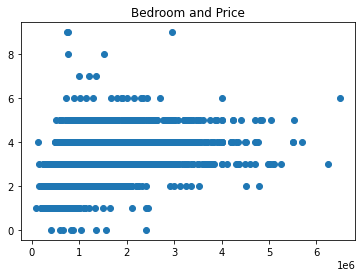

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

In [19]:
plt.scatter(re_all['Price'],re_all['Bedroom2'])
plt.title("Bedroom and Price")
plt.show()
sns.despine


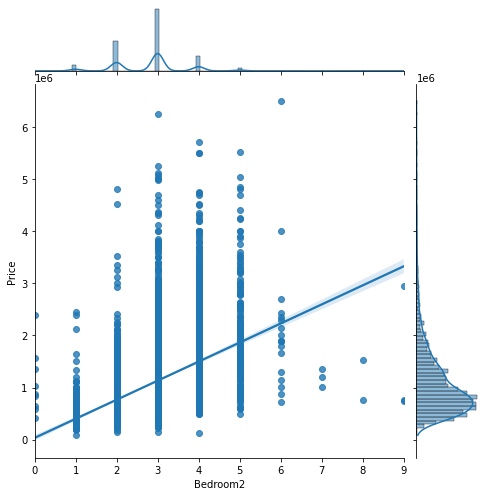

In [20]:
# A joint plot is used to visualize the bivariate distribution
sns.jointplot(x="Bedroom2", y="Price", data=re_all, kind = 'reg',  height = 7)
plt.show()

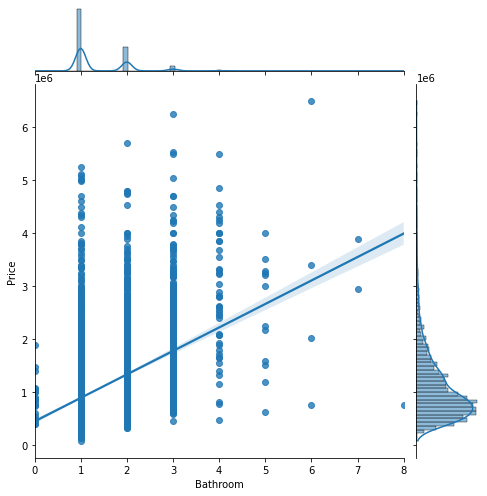

In [21]:
sns.jointplot(x='Bathroom', y="Price", data=re_all, kind = 'reg',  height = 7)
plt.show()

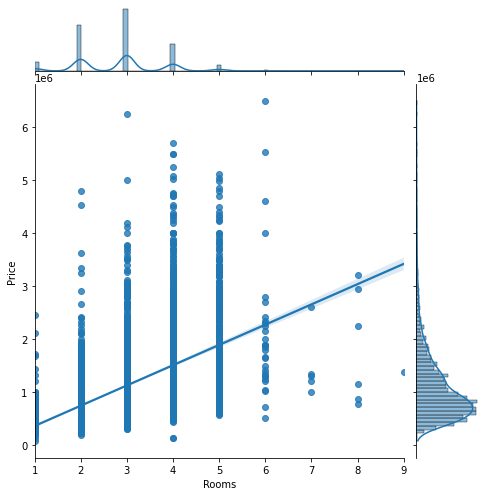

In [22]:
sns.jointplot(x='Rooms', y="Price", data=re_all, kind = 'reg', height = 7)
plt.show()

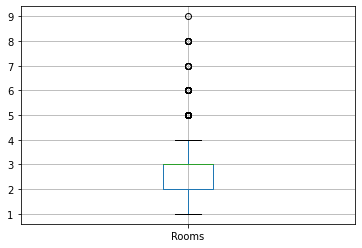

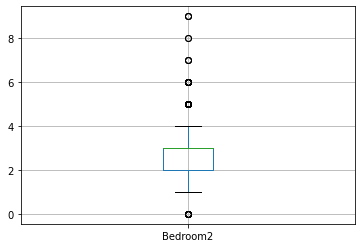

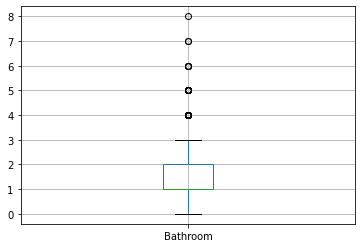

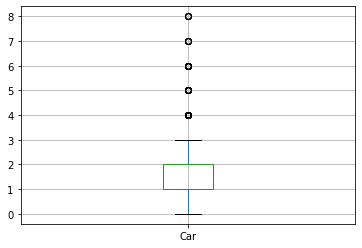

In [23]:
for col in re_all[data_to_plot]:
    plt.figure()
    re_all.boxplot([col])


## Categorical data to numeric


In [19]:
for col in re_all.select_dtypes('object'):
    print(col,":",re_all[col].nunique())

Suburb : 142
Address : 7468
Type : 3
Method : 5
SellerG : 182
CouncilArea : 19


In [20]:
re_all['Suburb'].value_counts()

Reservoir         270
Bentleigh East    202
Richmond          170
Preston           149
St Kilda          144
                 ... 
Docklands           4
Gardenvale          4
Travancore          3
Princes Hill        2
Kooyong             1
Name: Suburb, Length: 142, dtype: int64

In [21]:
re_all.drop('Address',axis=1,inplace=True)

In [22]:
k=re_all['Suburb'].value_counts()
for val in k.axes[0][0:20]:
    varname='Suburb_'+val.replace(',','_').replace(' ','_')
    re_all[varname]=np.where(re_all['Suburb']==val,1,0)
del re_all['Suburb']

In [23]:
k=re_all['SellerG'].value_counts()
for val in k.axes[0][0:20]:
    varname='SellerG_'+val.replace(',','_').replace(' ','_')
    re_all[varname]=np.where(re_all['SellerG']==val,1,0)
del re_all['SellerG']

In [24]:
for col in ['Type','Method','CouncilArea']:
    temp=pd.get_dummies(re_all[col],prefix=col,drop_first=True)
    re_all=pd.concat([temp,re_all],1)
    re_all.drop([col],1,inplace=True)

In [25]:
re_all.shape

(7536, 74)

In [26]:
re_all.corr()

,CouncilArea_Bayside,CouncilArea_Boroondara,CouncilArea_Brimbank,CouncilArea_Darebin,CouncilArea_Glen Eira,CouncilArea_Hobsons Bay,CouncilArea_Hume,CouncilArea_Kingston,CouncilArea_Manningham,CouncilArea_Maribyrnong,...,SellerG_Fletchers,SellerG_RT,SellerG_Greg,SellerG_Miles,SellerG_Sweeney,SellerG_Jas,SellerG_Gary,SellerG_Noel,SellerG_McGrath,SellerG_Hodges
CouncilArea_Bayside,1.000000,-0.117915,-0.030097,-0.049855,-0.047645,-0.032884,-0.006696,-0.015606,-0.026267,-0.041860,...,-0.026089,0.060483,-0.008381,-0.024996,-0.024716,-0.024622,-0.010376,-0.020867,-0.000891,0.238192
CouncilArea_Boroondara,-0.117915,1.000000,-0.105167,-0.174209,-0.166486,-0.114908,-0.023398,-0.054532,-0.091786,-0.146271,...,0.101740,0.052990,-0.044127,-0.028352,-0.031146,-0.052783,-0.002338,0.101480,-0.015651,-0.028582
CouncilArea_Brimbank,-0.030097,-0.105167,1.000000,-0.044465,-0.042494,-0.029329,-0.005972,-0.013919,-0.023428,-0.037334,...,-0.023269,-0.023109,-0.022377,-0.022294,0.084938,0.034886,-0.020215,-0.018611,-0.018611,-0.017290
CouncilArea_Darebin,-0.049855,-0.174209,-0.044465,1.000000,-0.070392,-0.048584,-0.009893,-0.023057,-0.038808,-0.061845,...,-0.034774,-0.038280,-0.037067,-0.029072,-0.036516,-0.036377,-0.033486,-0.030829,0.095557,-0.028641
CouncilArea_Glen Eira,-0.047645,-0.166486,-0.042494,-0.070392,1.000000,-0.046430,-0.009454,-0.022034,-0.037087,-0.059103,...,-0.032914,-0.028686,-0.031351,-0.035293,-0.034897,-0.034764,0.219604,-0.019724,0.004621,0.056339
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SellerG_Jas,-0.024622,-0.052783,0.034886,-0.036377,-0.034764,0.121258,-0.004886,-0.011387,-0.019166,0.346288,...,-0.019036,-0.018905,-0.018306,-0.018239,-0.018034,1.000000,-0.016538,-0.015225,-0.015225,-0.014145
SellerG_Gary,-0.010376,-0.002338,-0.020215,-0.033486,0.219604,-0.022087,-0.004497,0.002463,-0.017643,-0.028115,...,-0.017523,-0.017403,-0.016851,-0.016789,-0.016601,-0.016538,1.000000,-0.014015,-0.014015,-0.013020
SellerG_Noel,-0.020867,0.101480,-0.018611,-0.030829,-0.019724,-0.020335,-0.004141,-0.009650,-0.007799,-0.025885,...,-0.016133,-0.016022,-0.015514,-0.015457,-0.015284,-0.015225,-0.014015,1.000000,-0.012903,-0.011987
SellerG_McGrath,-0.000891,-0.015651,-0.018611,0.095557,0.004621,-0.020335,-0.004141,0.046464,-0.007799,-0.025885,...,-0.016133,-0.016022,-0.015514,-0.015457,-0.015284,-0.015225,-0.014015,-0.012903,1.000000,-0.011987


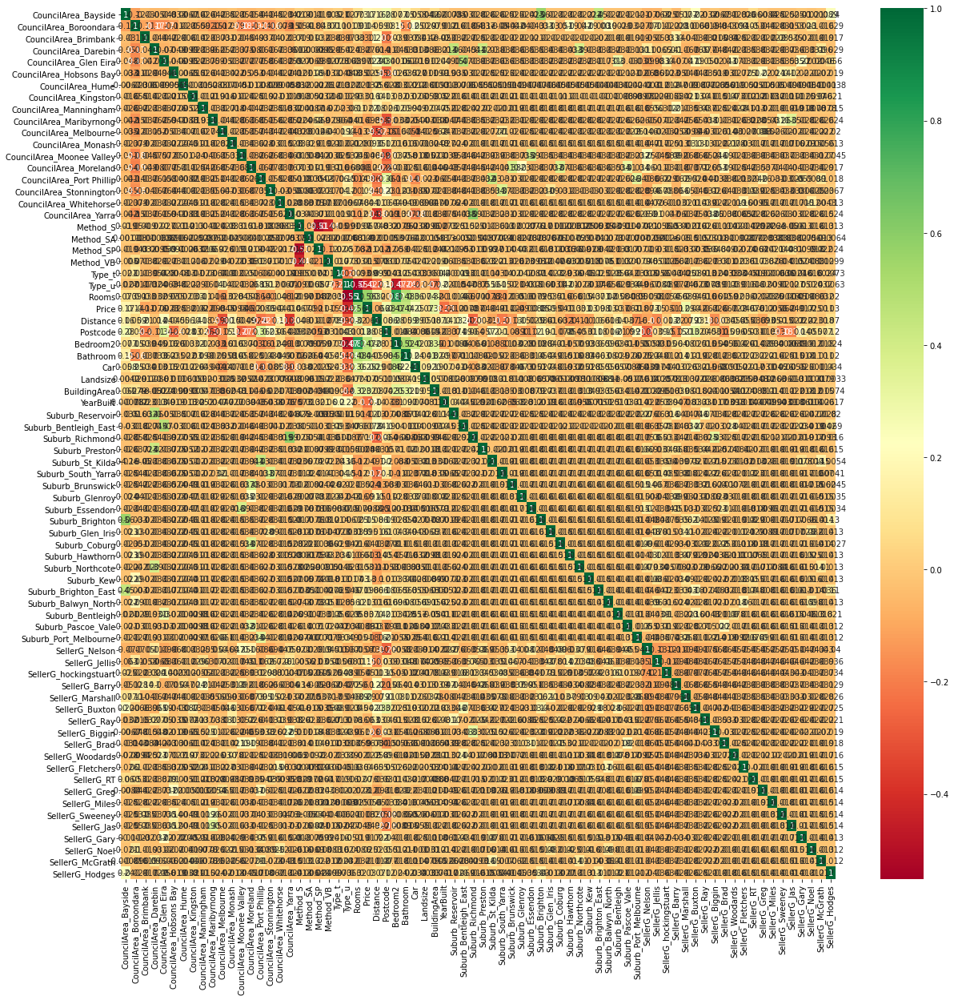

In [34]:
#get correlations of each features in dataset
corrmat = re_all.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(re_all[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [27]:
from  sklearn.model_selection import train_test_split

In [33]:
X=re_all.drop('Price',axis=1)
y=re_all['Price']

# Feature Selection

In [28]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [30]:
corr_features = correlation(X_train, 0.8)
len(set(corr_features))

In [31]:
corr_features

1

In [32]:
X_train=X_train.drop(corr_features,axis=1)
X_test=X_test.drop(corr_features,axis=1)


{'Bedroom2'}

In [53]:
from sklearn.linear_model import Ridge, Lasso

In [34]:
# Ridge Regression Model

lambdas=np.linspace(1,100,200)
params={'alpha':lambdas}

In [35]:
model=Ridge(fit_intercept=True)

In [36]:
from sklearn.model_selection import GridSearchCV
grid_search=GridSearchCV(model,param_grid=params,cv=10,scoring='neg_mean_absolute_error')

In [37]:
grid_search.fit(X_train,y_train)

In [38]:
grid_search.best_estimator_

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': array([  1.        ,   1.49748744,   1.99497487,   2.49246231,
         2.98994975,   3.48743719,   3.98492462,   4.48241206,
         4.9798995 ,   5.47738693,   5.97487437,   6.47236181,
         6.96984925,   7.46733668,   7.96482412,   8.46231156,
         8.95979899,   9.45728643,   9.95477387,  10.45226131,
        10.94974874,  11.44723618,  11.94472362,  12.44221106,
        12.93969849,  13.43718593,  13...
        86.5678392 ,  87.06532663,  87.56281407,  88.06030151,
        88.55778894,  89.05527638,  89.55276382,  90.05025126,
        90.54773869,  91.04522613,  91.54271357,  92.04020101,
        92.53768844,  93.03517588,  93.53266332,  94.03015075,
        94.52763819,  95.02512563,  95.52261307,  96.0201005 ,
        96.51758794,  97.01507538,  97.51256281,  98.01005025,
        98.50753769,  99.00502513,  99.50251256, 100.        ])},
             scoring='neg_mean_absolute_error')

In [39]:
ridge=grid_search.best_estimator_

Ridge(alpha=25.87437185929648)

In [40]:
ridge.fit(X_train,y_train)

In [41]:
prediction_ridge=ridge.predict(X_test)

Ridge(alpha=25.87437185929648)

In [42]:
sns.distplot(y_test-prediction_ridge)

C:\Users\POONAM\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Price', ylabel='Density'>

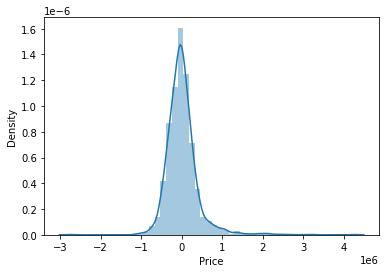

In [43]:
plt.scatter(y_test,prediction_ridge)

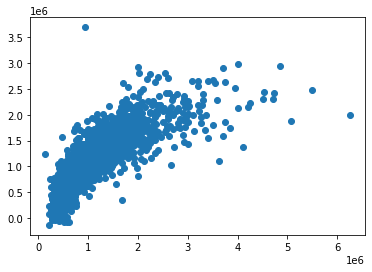

In [44]:
# Lasso Regression Model

lamdas_lasso=np.linspace(1,10,100)
model=Lasso(fit_intercept=True)
params={'alpha':lamdas_lasso}

In [45]:
grid_search=GridSearchCV(model,param_grid=params,cv=10,scoring="neg_mean_absolute_error")

In [46]:
grid_search.fit(X_train,y_train)

In [47]:
lasso_model=grid_search.best_estimator_

GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': array([ 1.        ,  1.09090909,  1.18181818,  1.27272727,  1.36363636,
        1.45454545,  1.54545455,  1.63636364,  1.72727273,  1.81818182,
        1.90909091,  2.        ,  2.09090909,  2.18181818,  2.27272727,
        2.36363636,  2.45454545,  2.54545455,  2.63636364,  2.72727273,
        2.81818182,  2.90909091,  3.        ,  3.09090909,  3.18181818,
        3.27272727,  3.36363636,  3.45454545,  3....
        6.90909091,  7.        ,  7.09090909,  7.18181818,  7.27272727,
        7.36363636,  7.45454545,  7.54545455,  7.63636364,  7.72727273,
        7.81818182,  7.90909091,  8.        ,  8.09090909,  8.18181818,
        8.27272727,  8.36363636,  8.45454545,  8.54545455,  8.63636364,
        8.72727273,  8.81818182,  8.90909091,  9.        ,  9.09090909,
        9.18181818,  9.27272727,  9.36363636,  9.45454545,  9.54545455,
        9.63636364,  9.72727273,  9.81818182,  9.90909091, 10.        ])},
       

In [48]:
lasso_model.fit(X_train,y_train)

In [49]:
prediction_lasso=lasso_model.predict(X_test)

Lasso(alpha=10.0)

In [50]:
sns.distplot(y_test-prediction_lasso)

C:\Users\POONAM\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Price', ylabel='Density'>

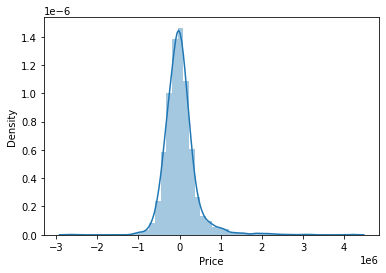

In [51]:
plt.scatter(y_test,prediction_lasso)

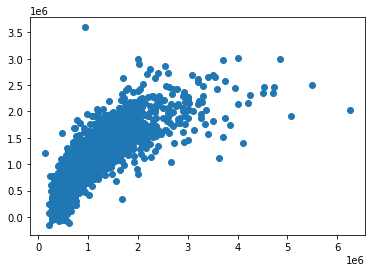

In [52]:
# RandomForest

from sklearn.ensemble import RandomForestRegressor

In [54]:
regressor=RandomForestRegressor()

In [55]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
print(n_estimators)

[100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200]


In [56]:
from sklearn.model_selection import RandomizedSearchCV

In [57]:
#Randomized Search CV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]

In [58]:
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [1, 2, 5, 10]}


In [59]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()

In [60]:
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = 1)

In [61]:
rf_random.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   4.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   4.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   4.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   4.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   4.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   6.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   5.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimator

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [62]:
rf_random.best_params_,rf_random.best_score_

({'n_estimators': 1000,
  'min_samples_split': 2,
  'min_samples_leaf': 1,
  'max_features': 'sqrt',
  'max_depth': 25},
 -107213507983.23294)

In [63]:
predictions=rf_random.predict(X_test)

C:\Users\POONAM\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Price', ylabel='Density'>

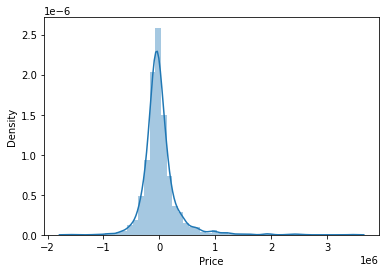

In [64]:
sns.distplot(y_test-predictions)

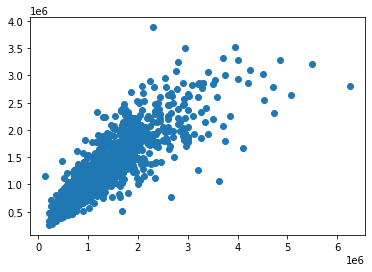

In [65]:
plt.scatter(y_test,predictions)

# Xgboost

In [66]:
import xgboost as xgb
xgb_reg_params = {
    'learning_rate':np.arange(0.05, 0.31, 0.05),
    'max_depth':np.arange(5, 16, 1, dtype=int),
    'min_child_weight': np.arange(1, 8, 1, dtype=int),
    'colsample_bytree':[i/10.0 for i in range(6,10)],
    'subsample':[i/10.0 for i in range(6,10)],
    'gamma':[i/10.0 for i in range(0,5)],
    'reg_lambda':[1e-5, 1e-2, 0.1, 1, 100]
}

In [67]:
reg = xgb.XGBRegressor()

In [68]:
xgb_random = RandomizedSearchCV(estimator = reg, param_distributions = xgb_reg_params, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

In [69]:
xgb_random.fit(X_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, gamma=None,
                                          gpu_id=None, importance_type='gain',
                                          interaction_constraints=None,
                                          learning_rate=None,
                                          max_delta_step=None, max_depth=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=100, n...
                                          verbosity=None),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.6, 0.7, 0.8,
             

In [70]:
xgb_random.best_params_

{'subsample': 0.6,
 'reg_lambda': 0.01,
 'min_child_weight': 6,
 'max_depth': 12,
 'learning_rate': 0.05,
 'gamma': 0.4,
 'colsample_bytree': 0.6}

In [71]:
xgb_finalmodel=xgb.XGBRegressor(subsample= 0.7,
 reg_lambda= 0.1,
 min_child_weight= 4,
 max_depth= 10,
 learning_rate= 0.05,
 gamma= 0.0,
 colsample_bytree= 0.6,verbosity=1)

In [72]:
xgb_finalmodel.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.6, gamma=0.0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=10,
             min_child_weight=4, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=0.1, scale_pos_weight=1, subsample=0.7,
             tree_method='exact', validate_parameters=1, verbosity=1)

In [73]:
prediction_xgb=xgb_finalmodel.predict(X_test)

C:\Users\POONAM\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Price', ylabel='Density'>

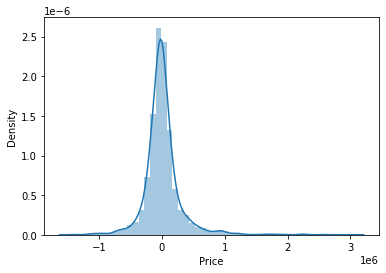

In [74]:
sns.distplot(y_test-prediction_xgb)

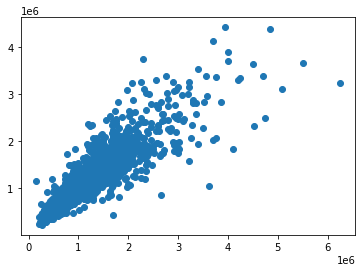

In [75]:
plt.scatter(y_test,prediction_xgb)